# K-Means Clustering of IMU and Odometry Data from TurtleBot3
### By Jacob Laframboise
Here we take in a dataset of imu data recorded from the TurtleBot3 Waffle Pi driving on 2 different surfaces at 4 different speeds each, and use K-means clustering to assign each data point to a cluster. Then we use PCA to visualize this high (118) dimension data in 2 or 3 dimensions. Matplotlib is used to plot in 2D, and Plotly is used to plot in 3D interactively, so we can better see the clusters. 

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import plotly as ply
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
%matplotlib notebook

pd.set_option('display.max_columns', 60)
pd.set_option('display.max_rows', 80)

In [15]:
dataFolder = r"C:\Users\jaker\Documents\RoboData-Experiment1"
data = "AllDataDf.csv"


df = pd.read_csv(os.path.join(dataFolder, data))

In [16]:
df = df.rename(columns={'Unnamed: 0': 'Seq'})
df = df.set_index('Seq')

In [17]:
df

,OdomPosX,OdomPosY,OdomOrientZ,OdomOrientW,OdomLinX,OdomAngZ,ImuOrientX,ImuOrientY,ImuOrientZ,ImuOrientW,ImuAngVelX,ImuAngVelY,ImuAngVelZ,ImuAccelX,ImuAccelY,ImuAccelZ,TimeDelta2,TimeDelta4,TimeDelta8,TimeDelta16,TimeDelta32,TimeDelta64,OdomPosXDelta2,OdomPosXDelta4,OdomPosXDelta8,OdomPosXDelta16,OdomPosXDelta32,OdomPosXDelta64,OdomPosYDelta2,OdomPosYDelta4,...,ImuAngVelYDelta8,ImuAngVelYDelta16,ImuAngVelYDelta32,ImuAngVelYDelta64,ImuAngVelZDelta2,ImuAngVelZDelta4,ImuAngVelZDelta8,ImuAngVelZDelta16,ImuAngVelZDelta32,ImuAngVelZDelta64,ImuAccelXDelta2,ImuAccelXDelta4,ImuAccelXDelta8,ImuAccelXDelta16,ImuAccelXDelta32,ImuAccelXDelta64,ImuAccelYDelta2,ImuAccelYDelta4,ImuAccelYDelta8,ImuAccelYDelta16,ImuAccelYDelta32,ImuAccelYDelta64,ImuAccelZDelta2,ImuAccelZDelta4,ImuAccelZDelta8,ImuAccelZDelta16,ImuAccelZDelta32,ImuAccelZDelta64,Speed,Terrain
Seq,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,101.055844,7.616985,0.274688,0.961533,0.151574,-0.000236,0.000515,-0.013383,-0.542873,0.839703,0.019156,0.040440,-0.005321,0.225055,0.058059,10.169971,0.008933,0.027088,0.045897,0.100897,0.193743,0.392171,0.001234,0.002468,0.004935,0.012789,0.026364,0.050366,0.000768,0.001536,...,0.089393,0.114934,0.046293,0.032990,0.005321,0.003193,-0.018091,-0.010642,0.000532,-0.005321,-0.077213,-0.089184,0.347159,0.433949,0.384569,-0.465373,-0.108338,-0.156820,0.049680,-0.055665,-0.148141,-0.256778,-0.481833,-1.060631,0.010176,0.308852,-0.015562,0.110433,15,Turf
1,101.056461,7.617369,0.274684,0.961535,0.152222,-0.000639,0.000125,-0.012841,-0.542871,0.839713,0.014899,0.000000,0.000000,0.180164,0.053870,9.819818,0.008593,0.020947,0.045709,0.100557,0.192423,0.388461,0.001234,0.002468,0.004935,0.012776,0.026166,0.050366,0.000768,0.001536,...,0.048953,0.059595,0.000000,0.015963,0.005321,0.009578,-0.012770,0.000000,0.011706,0.000000,-0.044891,-0.128090,0.302268,0.536900,0.414197,-0.386065,-0.004190,-0.136769,0.045490,-0.280122,-0.172981,-0.264559,-0.350152,-1.121384,-0.339976,-0.648230,-0.219667,-0.132279,15,Turf
2,101.057078,7.617753,0.274680,0.961536,0.152870,-0.001043,-0.000588,-0.012803,-0.542864,0.839718,0.004257,-0.009578,0.000000,0.226851,0.102951,9.752182,0.008614,0.017547,0.044836,0.100886,0.192817,0.388869,0.001234,0.002468,0.004935,0.012763,0.025968,0.050366,0.000768,0.001536,...,0.074494,0.003193,-0.047889,0.048953,0.005321,0.010642,-0.013835,0.000000,0.032990,-0.004257,0.001796,-0.075417,0.456694,0.660201,-0.076614,-0.044891,0.044891,-0.063446,0.091578,-0.289698,-0.201113,-0.242413,-0.417789,-0.899621,-1.003170,-1.241992,-0.932542,-0.173579,15,Turf
3,101.057695,7.618137,0.274676,0.961537,0.153517,-0.001446,-0.000782,-0.013441,-0.542873,0.839702,-0.005321,0.011706,-0.005321,0.457293,0.200514,10.244190,0.008895,0.017488,0.044415,0.093349,0.191656,0.387782,0.001234,0.002468,0.004935,0.012750,0.025770,0.050366,0.000768,0.001536,...,0.034054,-0.002128,-0.026605,0.070237,-0.005321,0.000000,-0.005321,-0.003193,0.027669,-0.009578,0.277129,0.232238,0.454300,0.668880,0.153827,0.185551,0.146645,0.142455,-0.007781,-0.222062,-0.103549,-0.144849,0.424372,0.074220,-0.913388,-0.936133,-0.440534,0.318429,15,Turf
4,101.058311,7.618521,0.274671,0.961538,0.154165,-0.001850,-0.000898,-0.013697,-0.542884,0.839690,-0.005853,0.027137,-0.007449,0.643142,0.214580,10.477325,0.014101,0.022715,0.049803,0.096876,0.197264,0.392285,0.001234,0.002468,0.004935,0.011790,0.025572,0.050366,0.000768,0.001536,...,-0.014367,-0.013302,-0.030330,0.110145,-0.007449,-0.002128,0.001064,-0.003193,0.043632,-0.014899,0.416292,0.418087,0.328903,0.632967,0.030227,0.541389,0.111630,0.156521,-0.000299,-0.237924,-0.200215,-0.106841,0.725143,0.307355,-0.753276,-0.889147,-0.322918,0.332495,15,Turf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5564,82.532381,-0.199052,0.151784,0.988414,0.14

In [18]:
print(df.isnull().sum().sum()) # check for NaN
df.shape

0


(133284, 120)

### Kmeans
#### Now that we have processed the data, we can apply Kmeans to cluster it.

In [19]:
terrains = df['Terrain']
speeds = df['Speed']
df= df.drop(columns=['Terrain', 'Speed'])

In [20]:
speeds

Seq
0       15
1       15
2       15
3       15
4       15
        ..
5564    15
5565    15
5566    15
5567    15
5568    15
Name: Speed, Length: 133284, dtype: int64

In [21]:
scaler = StandardScaler()

scaledFeatures = scaler.fit_transform(df.values)

df = pd.DataFrame(scaledFeatures, columns = df.columns.tolist())

#df = pd.DataFrame(scaler.fit_transform(df))

In [22]:
df.head(8)

,OdomPosX,OdomPosY,OdomOrientZ,OdomOrientW,OdomLinX,OdomAngZ,ImuOrientX,ImuOrientY,ImuOrientZ,ImuOrientW,ImuAngVelX,ImuAngVelY,ImuAngVelZ,ImuAccelX,ImuAccelY,ImuAccelZ,TimeDelta2,TimeDelta4,TimeDelta8,TimeDelta16,TimeDelta32,TimeDelta64,OdomPosXDelta2,OdomPosXDelta4,OdomPosXDelta8,OdomPosXDelta16,OdomPosXDelta32,OdomPosXDelta64,OdomPosYDelta2,OdomPosYDelta4,...,ImuAngVelYDelta2,ImuAngVelYDelta4,ImuAngVelYDelta8,ImuAngVelYDelta16,ImuAngVelYDelta32,ImuAngVelYDelta64,ImuAngVelZDelta2,ImuAngVelZDelta4,ImuAngVelZDelta8,ImuAngVelZDelta16,ImuAngVelZDelta32,ImuAngVelZDelta64,ImuAccelXDelta2,ImuAccelXDelta4,ImuAccelXDelta8,ImuAccelXDelta16,ImuAccelXDelta32,ImuAccelXDelta64,ImuAccelYDelta2,ImuAccelYDelta4,ImuAccelYDelta8,ImuAccelYDelta16,ImuAccelYDelta32,ImuAccelYDelta64,ImuAccelZDelta2,ImuAccelZDelta4,ImuAccelZDelta8,ImuAccelZDelta16,ImuAccelZDelta32,ImuAccelZDelta64
0,1.339089,1.859821,1.673872,-2.462582,1.055963,-0.058837,0.045108,-0.673343,-0.532989,0.975006,0.842063,1.382699,-0.389494,0.063550,-0.726458,-0.361137,-0.216702,0.116205,-0.113147,0.073104,-0.097480,-0.034496,0.092365,0.107708,0.126459,0.654091,0.812041,0.715219,1.289849,1.401138,...,-0.987998,-0.025199,1.885276,2.521557,1.069767,0.759937,0.560025,0.209456,-0.919525,-0.522969,0.026215,-0.266801,-0.218640,-0.190296,0.723901,0.931041,0.912485,-1.075951,-0.474819,-0.489166,0.157921,-0.180628,-0.553391,-0.933731,-0.628760,-1.210564,0.012118,0.366319,-0.020307,0.138410
1,1.339108,1.859899,1.673839,-2.462478,1.068275,-0.093863,-0.083801,-0.635992,-0.532987,0.975019,0.625200,0.082257,-0.026339,-0.078106,-0.746607,-0.969489,-0.238674,-0.169333,-0.119649,0.063305,-0.140763,-0.135684,0.092365,0.107708,0.126459,0.651817,0.792699,0.715219,1.289849,1.401138,...,-1.501781,-1.288747,1.032439,1.307502,0.000239,0.367870,0.560025,0.628191,-0.649054,0.000123,0.591134,-0.001321,-0.127125,-0.273283,0.630303,1.151947,0.982779,-0.892582,-0.018271,-0.426615,0.144598,-0.909116,-0.646155,-0.962007,-0.456943,-1.279903,-0.407162,-0.768895,-0.280865,-0.165824
2,1.339127,1.859977,1.673806,-2.462375,1.080588,-0.128889,-0.319720,-0.633406,-0.532976,0.975027,0.083044,-0.225742,-0.026339,0.069216,-0.510574,-1.087000,-0.237329,-0.327383,-0.149763,0.072768,-0.127846,-0.124568,0.092365,0.107708,0.126459,0.649543,0.773357,0.715219,1.289849,1.401138,...,-1.857477,-1.819437,1.571073,0.070101,-1.106170,1.127500,0.560025,0.697980,-0.703148,0.000123,1.667172,-0.213705,0.005064,-0.160931,0.952280,1.416520,-0.181691,-0.103746,0.196884,-0.197885,0.291150,-0.940199,-0.751214,-0.881529,-0.545195,-1.026798,-1.201285,-1.473169,-1.190907,-0.217592
3,1.339146,1.860055,1.673773,-2.462271,1.092901,-0.163915,-0.383935,-0.677382,-0.532990,0.975003,-0.404898,0.458701,-0.389494,0.796386,-0.041388,-0.232188,-0.219169,-0.330132,-0.164265,-0.144158,-0.165912,-0.154192,0.092365,0.107708,0.126459,0.647269,0.754015,0.715219,1.289849,1.401138,...,0.434786,-0.682244,0.718236,-0.046635,-0.614433,1.617584,-0.559841,0.000088,-0.270395,-0.156804,1.398163,-0.479185,0.784637,0.495303,0.947288,1.435143,0.365042,0.429065,0.642937,0.444428,-0.024792,-0.720681,-0.386862,-0.526987,0.553658,0.084680,-1.093778,-1.110383,-0.562819,0.399128
4,1.339165,1.860134,1.673740,-2.462168,1.105214,-0.198941,-0.422209,-0.695000,-0.533005,0.974987,-0.432005,0.954922,-0.534756,1.382844,0.026256,0.172860,0.116499,-0.087129,0.021570,-0.042648,0.017975,-0.031392,0.092365,0.107708,0.126459,0.480384,0.734673,0.715219,1.289849,1.401138,...,1.363548,-0.315815,-0.302924,-0.291781,-0.700487,2.536491,-0.783814,-0.139490,0.054170,-0.156804,2.205191,-0.744664,1.178660,0.891725,0.685838,1.358083,0.071794,1.251807,0.489443,0.488307,-0.001002,-0.772161,-0.747861,-0.388868,0.946106,0.350766,-0.902056,-1.054652,-0.412672,0.416759
5,1.339214,1.860332,1.672764,-2.459097,1.048431,-0.734124,-0.460484,-0.712618,-0.533021,0.974971,-0.459113,1.451144,-0.680018,1.969301,0.093899,0.577908,0.257380,0.027547,-0.105184,-0.014225,-0.136943,0.026398,0.919589,0.590166,0.409800,0.477731,0.807638

In [23]:
kmeans = KMeans(n_clusters=8)
kmeans.fit(df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [24]:
labels = kmeans.predict(df)
centroids = kmeans.cluster_centers_

In [25]:
df

,OdomPosX,OdomPosY,OdomOrientZ,OdomOrientW,OdomLinX,OdomAngZ,ImuOrientX,ImuOrientY,ImuOrientZ,ImuOrientW,ImuAngVelX,ImuAngVelY,ImuAngVelZ,ImuAccelX,ImuAccelY,ImuAccelZ,TimeDelta2,TimeDelta4,TimeDelta8,TimeDelta16,TimeDelta32,TimeDelta64,OdomPosXDelta2,OdomPosXDelta4,OdomPosXDelta8,OdomPosXDelta16,OdomPosXDelta32,OdomPosXDelta64,OdomPosYDelta2,OdomPosYDelta4,...,ImuAngVelYDelta2,ImuAngVelYDelta4,ImuAngVelYDelta8,ImuAngVelYDelta16,ImuAngVelYDelta32,ImuAngVelYDelta64,ImuAngVelZDelta2,ImuAngVelZDelta4,ImuAngVelZDelta8,ImuAngVelZDelta16,ImuAngVelZDelta32,ImuAngVelZDelta64,ImuAccelXDelta2,ImuAccelXDelta4,ImuAccelXDelta8,ImuAccelXDelta16,ImuAccelXDelta32,ImuAccelXDelta64,ImuAccelYDelta2,ImuAccelYDelta4,ImuAccelYDelta8,ImuAccelYDelta16,ImuAccelYDelta32,ImuAccelYDelta64,ImuAccelZDelta2,ImuAccelZDelta4,ImuAccelZDelta8,ImuAccelZDelta16,ImuAccelZDelta32,ImuAccelZDelta64
0,1.339089,1.859821,1.673872,-2.462582,1.055963,-0.058837,0.045108,-0.673343,-0.532989,0.975006,0.842063,1.382699,-0.389494,0.063550,-0.726458,-0.361137,-0.216702,0.116205,-0.113147,0.073104,-0.097480,-0.034496,0.092365,0.107708,0.126459,0.654091,0.812041,0.715219,1.289849,1.401138,...,-0.987998,-0.025199,1.885276,2.521557,1.069767,0.759937,0.560025,0.209456,-0.919525,-0.522969,0.026215,-0.266801,-0.218640,-0.190296,0.723901,0.931041,0.912485,-1.075951,-0.474819,-0.489166,0.157921,-0.180628,-0.553391,-0.933731,-0.628760,-1.210564,0.012118,0.366319,-0.020307,0.138410
1,1.339108,1.859899,1.673839,-2.462478,1.068275,-0.093863,-0.083801,-0.635992,-0.532987,0.975019,0.625200,0.082257,-0.026339,-0.078106,-0.746607,-0.969489,-0.238674,-0.169333,-0.119649,0.063305,-0.140763,-0.135684,0.092365,0.107708,0.126459,0.651817,0.792699,0.715219,1.289849,1.401138,...,-1.501781,-1.288747,1.032439,1.307502,0.000239,0.367870,0.560025,0.628191,-0.649054,0.000123,0.591134,-0.001321,-0.127125,-0.273283,0.630303,1.151947,0.982779,-0.892582,-0.018271,-0.426615,0.144598,-0.909116,-0.646155,-0.962007,-0.456943,-1.279903,-0.407162,-0.768895,-0.280865,-0.165824
2,1.339127,1.859977,1.673806,-2.462375,1.080588,-0.128889,-0.319720,-0.633406,-0.532976,0.975027,0.083044,-0.225742,-0.026339,0.069216,-0.510574,-1.087000,-0.237329,-0.327383,-0.149763,0.072768,-0.127846,-0.124568,0.092365,0.107708,0.126459,0.649543,0.773357,0.715219,1.289849,1.401138,...,-1.857477,-1.819437,1.571073,0.070101,-1.106170,1.127500,0.560025,0.697980,-0.703148,0.000123,1.667172,-0.213705,0.005064,-0.160931,0.952280,1.416520,-0.181691,-0.103746,0.196884,-0.197885,0.291150,-0.940199,-0.751214,-0.881529,-0.545195,-1.026798,-1.201285,-1.473169,-1.190907,-0.217592
3,1.339146,1.860055,1.673773,-2.462271,1.092901,-0.163915,-0.383935,-0.677382,-0.532990,0.975003,-0.404898,0.458701,-0.389494,0.796386,-0.041388,-0.232188,-0.219169,-0.330132,-0.164265,-0.144158,-0.165912,-0.154192,0.092365,0.107708,0.126459,0.647269,0.754015,0.715219,1.289849,1.401138,...,0.434786,-0.682244,0.718236,-0.046635,-0.614433,1.617584,-0.559841,0.000088,-0.270395,-0.156804,1.398163,-0.479185,0.784637,0.495303,0.947288,1.435143,0.365042,0.429065,0.642937,0.444428,-0.024792,-0.720681,-0.386862,-0.526987,0.553658,0.084680,-1.093778,-1.110383,-0.562819,0.399128
4,1.339165,1.860134,1.673740,-2.462168,1.105214,-0.198941,-0.422209,-0.695000,-0.533005,0.974987,-0.432005,0.954922,-0.534756,1.382844,0.026256,0.172860,0.116499,-0.087129,0.021570,-0.042648,0.017975,-0.031392,0.092365,0.107708,0.126459,0.480384,0.734673,0.715219,1.289849,1.401138,...,1.363548,-0.315815,-0.302924,-0.291781,-0.700487,2.536491,-0.783814,-0.139490,0.054170,-0.156804,2.205191,-0.744664,1.178660,0.891725,0.685838,1.358083,0.071794,1.251807,0.489443,0.488307,-0.001002,-0.772161,-0.747861,-0.388868,0.946106,0.350766,-0.902056,-1.054652,-0.412672,0.416759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133279

In [26]:
df['Cluster'] = labels
df['Speed'] = speeds.values
df['Terrain'] = terrains.values

In [27]:
df.head(10)

,OdomPosX,OdomPosY,OdomOrientZ,OdomOrientW,OdomLinX,OdomAngZ,ImuOrientX,ImuOrientY,ImuOrientZ,ImuOrientW,ImuAngVelX,ImuAngVelY,ImuAngVelZ,ImuAccelX,ImuAccelY,ImuAccelZ,TimeDelta2,TimeDelta4,TimeDelta8,TimeDelta16,TimeDelta32,TimeDelta64,OdomPosXDelta2,OdomPosXDelta4,OdomPosXDelta8,OdomPosXDelta16,OdomPosXDelta32,OdomPosXDelta64,OdomPosYDelta2,OdomPosYDelta4,...,ImuAngVelYDelta16,ImuAngVelYDelta32,ImuAngVelYDelta64,ImuAngVelZDelta2,ImuAngVelZDelta4,ImuAngVelZDelta8,ImuAngVelZDelta16,ImuAngVelZDelta32,ImuAngVelZDelta64,ImuAccelXDelta2,ImuAccelXDelta4,ImuAccelXDelta8,ImuAccelXDelta16,ImuAccelXDelta32,ImuAccelXDelta64,ImuAccelYDelta2,ImuAccelYDelta4,ImuAccelYDelta8,ImuAccelYDelta16,ImuAccelYDelta32,ImuAccelYDelta64,ImuAccelZDelta2,ImuAccelZDelta4,ImuAccelZDelta8,ImuAccelZDelta16,ImuAccelZDelta32,ImuAccelZDelta64,Cluster,Speed,Terrain
0,1.339089,1.859821,1.673872,-2.462582,1.055963,-0.058837,0.045108,-0.673343,-0.532989,0.975006,0.842063,1.382699,-0.389494,0.063550,-0.726458,-0.361137,-0.216702,0.116205,-0.113147,0.073104,-0.097480,-0.034496,0.092365,0.107708,0.126459,0.654091,0.812041,0.715219,1.289849,1.401138,...,2.521557,1.069767,0.759937,0.560025,0.209456,-0.919525,-0.522969,0.026215,-0.266801,-0.218640,-0.190296,0.723901,0.931041,0.912485,-1.075951,-0.474819,-0.489166,0.157921,-0.180628,-0.553391,-0.933731,-0.628760,-1.210564,0.012118,0.366319,-0.020307,0.138410,7,15,Turf
1,1.339108,1.859899,1.673839,-2.462478,1.068275,-0.093863,-0.083801,-0.635992,-0.532987,0.975019,0.625200,0.082257,-0.026339,-0.078106,-0.746607,-0.969489,-0.238674,-0.169333,-0.119649,0.063305,-0.140763,-0.135684,0.092365,0.107708,0.126459,0.651817,0.792699,0.715219,1.289849,1.401138,...,1.307502,0.000239,0.367870,0.560025,0.628191,-0.649054,0.000123,0.591134,-0.001321,-0.127125,-0.273283,0.630303,1.151947,0.982779,-0.892582,-0.018271,-0.426615,0.144598,-0.909116,-0.646155,-0.962007,-0.456943,-1.279903,-0.407162,-0.768895,-0.280865,-0.165824,7,15,Turf
2,1.339127,1.859977,1.673806,-2.462375,1.080588,-0.128889,-0.319720,-0.633406,-0.532976,0.975027,0.083044,-0.225742,-0.026339,0.069216,-0.510574,-1.087000,-0.237329,-0.327383,-0.149763,0.072768,-0.127846,-0.124568,0.092365,0.107708,0.126459,0.649543,0.773357,0.715219,1.289849,1.401138,...,0.070101,-1.106170,1.127500,0.560025,0.697980,-0.703148,0.000123,1.667172,-0.213705,0.005064,-0.160931,0.952280,1.416520,-0.181691,-0.103746,0.196884,-0.197885,0.291150,-0.940199,-0.751214,-0.881529,-0.545195,-1.026798,-1.201285,-1.473169,-1.190907,-0.217592,7,15,Turf
3,1.339146,1.860055,1.673773,-2.462271,1.092901,-0.163915,-0.383935,-0.677382,-0.532990,0.975003,-0.404898,0.458701,-0.389494,0.796386,-0.041388,-0.232188,-0.219169,-0.330132,-0.164265,-0.144158,-0.165912,-0.154192,0.092365,0.107708,0.126459,0.647269,0.754015,0.715219,1.289849,1.401138,...,-0.046635,-0.614433,1.617584,-0.559841,0.000088,-0.270395,-0.156804,1.398163,-0.479185,0.784637,0.495303,0.947288,1.435143,0.365042,0.429065,0.642937,0.444428,-0.024792,-0.720681,-0.386862,-0.526987,0.553658,0.084680,-1.093778,-1.110383,-0.562819,0.399128,7,15,Turf
4,1.339165,1.860134,1.673740,-2.462168,1.105214,-0.198941,-0.422209,-0.695000,-0.533005,0.974987,-0.432005,0.954922,-0.534756,1.382844,0.026256,0.172860,0.116499,-0.087129,0.021570,-0.042648,0.017975,-0.031392,0.092365,0.107708,0.126459,0.480384,0.734673,0.715219,1.289849,1.401138,...,-0.291781,-0.700487,2.536491,-0.783814,-0.139490,0.054170,-0.156804,2.205191,-0.744664,1.178660,0.891725,0.685838,1.358083,0.071794,1.251807,0.489443,0.488307,-0.001002,-0.772161,-0.747861,-0.388868,0.946106,0.350766,-0.902056,-1.054652,-0.412672,0.416759,7,15,Turf
5,1.339214,1.860332,1.672764,-2.459097,1.048431,-0.734124,-0.460484,-0.712618,-0.533021,0.974971,-0.459113,1.451144,-0.680018,1.969301,0.093899,0.577908,0.257380,0.027547,-0.105184,-0.014225,-0.136943,0.026398,0.919589,0.590166,0.409800,0.477731,0.807638,0.762599,2.557788,2.089800,...,-0.560273,-0.282510,2.548743,-0.447854,-0.628014,0.000076,-0.470660,2.474200,-0.691568,1.05

In [28]:
pca_1d = PCA(n_components=1)
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

In [29]:
pc1Df = pd.DataFrame(pca_1d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))
pc2Df = pd.DataFrame(pca_2d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))
pc3Df = pd.DataFrame(pca_3d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))

In [30]:
pc1Df.columns = ["PC1_1d"]
pc2Df.columns = ["PC1_2d", "PC2_2d"]
pc3Df.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

In [31]:
pc3Df.head()

,PC1_3d,PC2_3d,PC3_3d
0,-4.999828,5.589107,-0.255644
1,-4.526104,5.700155,-1.851392
2,-4.155004,5.724334,-2.207074
3,-4.352131,5.618272,-0.411711
4,-4.271620,5.526966,0.226132


In [32]:
pc3Df.tail()

,PC1_3d,PC2_3d,PC3_3d
133279,0.468725,1.948255,2.344313
133280,0.672528,1.852986,3.328185
133281,-1.294478,1.767594,4.700595
133282,-2.596006,1.880369,5.449092
133283,-2.170231,1.997137,6.320106


In [33]:
df = pd.concat([df, pc1Df, pc2Df, pc3Df], axis=1, join='inner')
df['Zeros']=0

In [34]:
c0 = df[df['Cluster']==0]
c1 = df[df['Cluster']==1]
c2 = df[df['Cluster']==2]
c3 = df[df['Cluster']==3]
c4 = df[df['Cluster']==4]
c5 = df[df['Cluster']==5]
c6 = df[df['Cluster']==6]
c7 = df[df['Cluster']==7]

In [51]:
results = df[['Cluster', 'Terrain', 'Speed']]

In [63]:
results.groupby('Cluster')

In [69]:
for c in range(8):
    print(c)
    r = results[results.Cluster==c].drop(columns='Speed')
    print(r.groupby('Terrain').count())
    print('\n')
#     print(r.shape[0])
#     print(r.Terrain.count('Turf'))
#     print(r.Terrain.count('MitTile'))

0
         Cluster
Terrain         
MitTile       47
Turf        6753


1
         Cluster
Terrain         
Turf       23567


2
         Cluster
Terrain         
MitTile     2060
Turf       11247


3
         Cluster
Terrain         
MitTile     8495
Turf         188


4
         Cluster
Terrain         
MitTile     7702
Turf         303


5
         Cluster
Terrain         
MitTile    14301
Turf       19078


6
         Cluster
Terrain         
MitTile    31961
Turf          17


7
         Cluster
Terrain         
MitTile       46
Turf        7519




<IPython.core.display.Javascript object>


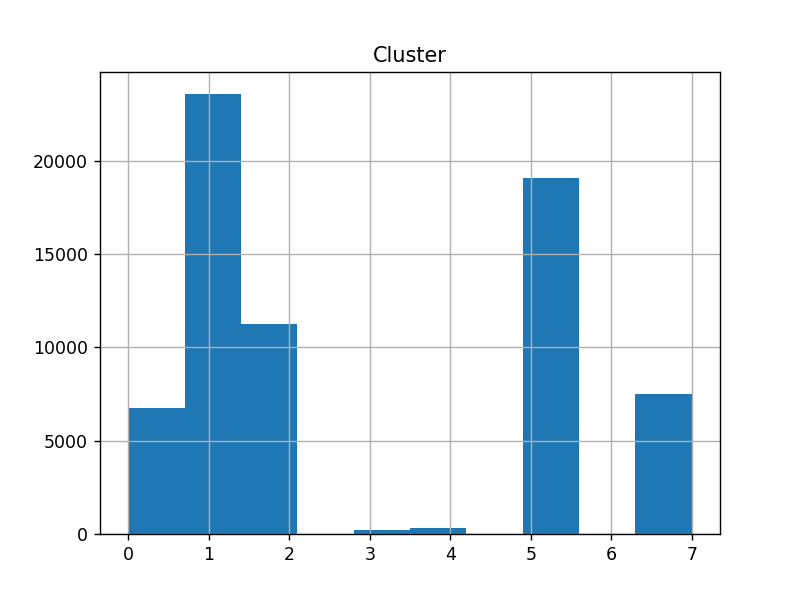

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001CA64478948>]],
      dtype=object)

In [55]:
results[results['Terrain']=='Turf'].drop(columns='Speed').hist()

<IPython.core.display.Javascript object>


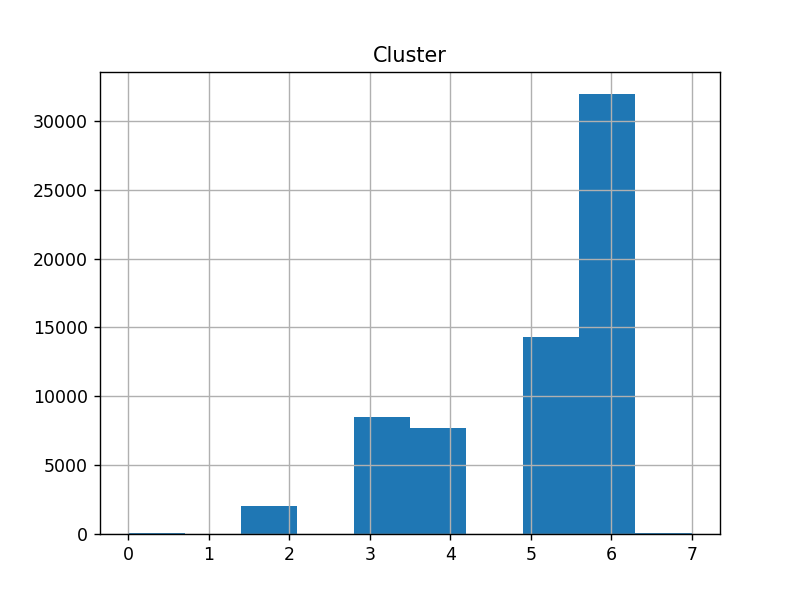

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001CA64BAE408>]],
      dtype=object)

<IPython.core.display.Javascript object>


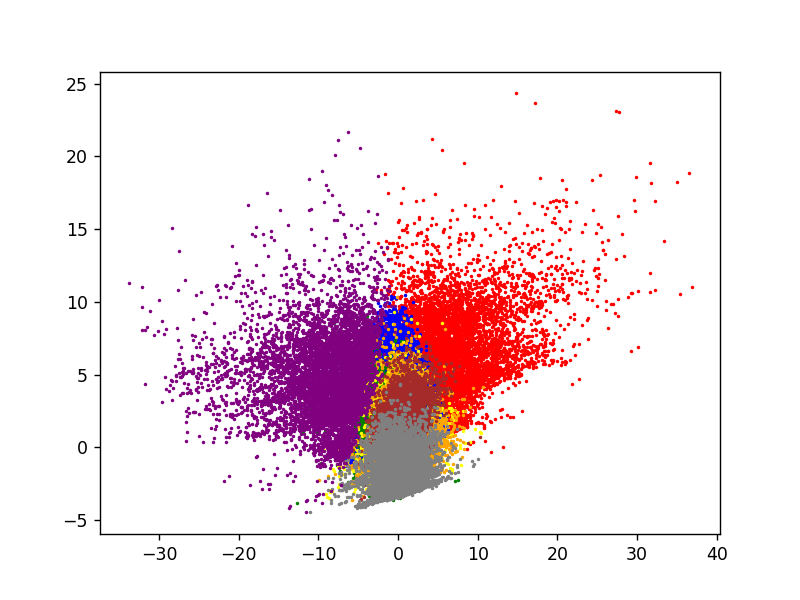

In [35]:
plt.figure()
plt.scatter(x=c0['PC1_2d'], y=c0['PC2_2d'], c='red', s=1)
plt.scatter(x=c1['PC1_2d'], y=c1['PC2_2d'], c='blue', s=1)
plt.scatter(x=c2['PC1_2d'], y=c2['PC2_2d'], c='green', s=1)
plt.scatter(x=c3['PC1_2d'], y=c3['PC2_2d'], c='yellow', s=1)
plt.scatter(x=c4['PC1_2d'], y=c4['PC2_2d'], c='orange', s=1)
plt.scatter(x=c5['PC1_2d'], y=c5['PC2_2d'], c='brown', s=1)
plt.scatter(x=c6['PC1_2d'], y=c6['PC2_2d'], c='grey', s=1)
plt.scatter(x=c7['PC1_2d'], y=c7['PC2_2d'], c='purple', s=1)

In [36]:
init_notebook_mode(connected=True)

In [37]:
t0 = go.Scatter3d(x=c0['PC1_3d'], y=c0['PC2_3d'], z=c0['PC3_3d'],
               mode="markers", name="Cluster 0",
               marker = dict(color = 'purple'),
               text=None)
t1 = go.Scatter3d(x=c1['PC1_3d'], y=c1['PC2_3d'], z=c1['PC3_3d'],
               mode="markers", name="Cluster 1",
               marker = dict(color = 'brown'),
               text=None)
t2 = go.Scatter3d(x=c2['PC1_3d'], y=c2['PC2_3d'], z=c2['PC3_3d'],
               mode="markers", name="Cluster 2",
               marker = dict(color = 'grey'),
               text=None)
t3 = go.Scatter3d(x=c3['PC1_3d'], y=c3['PC2_3d'], z=c3['PC3_3d'],
               mode="markers", name="Cluster 3",
               marker = dict(color = 'blue'),
               text=None)
t4 = go.Scatter3d(x=c4['PC1_3d'], y=c4['PC2_3d'], z=c4['PC3_3d'],
               mode="markers", name="Cluster 4",
               marker = dict(color = 'green'),
               text=None)
t5 = go.Scatter3d(x=c5['PC1_3d'], y=c5['PC2_3d'], z=c5['PC3_3d'],
               mode="markers", name="Cluster 5",
               marker = dict(color = 'orange'),
               text=None)
t6 = go.Scatter3d(x=c6['PC1_3d'], y=c6['PC2_3d'], z=c6['PC3_3d'],
               mode="markers", name="Cluster 6",
               marker = dict(color = 'red'),
               text=None)
t7 = go.Scatter3d(x=c7['PC1_3d'], y=c7['PC2_3d'], z=c7['PC3_3d'],
               mode="markers", name="Cluster 7",
               marker = dict(color = 'yellow'),
               text=None)
plotData = [t0, t1, t2, t3, t4, t5, t6, t7]
title = "IMU Clustering"
layout = dict(title=title, xaxis=dict(title='PC1',ticklen= 5,zeroline= False), yaxis=dict(title= '',ticklen= 5,zeroline= False))

fig=dict(data=plotData, layout=layout)

In [38]:
iplot(fig)